In [1]:
# one hot encode runway
# ordinal encode airline
# TODO: Try with avg pb time, ratioH/M, ratio nominal
from traffic.core import Traffic

import pandas as pd
import numpy as np
import pickle

import os.path

from ipyleaflet import Polygon
from ipywidgets import Layout
from ipyleaflet import Map, Marker

from cartes.osm import Overpass

from sklearn import svm

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import altair as alt

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt

from collections import namedtuple

import os

In [3]:
dep_arr_df = pd.read_pickle(
    "../data/processed/dep_arr_df14_nextavgdelaybetteraffected.pkl"
)

In [4]:
" ".join(dep_arr_df.columns)

'flight_id on_runway_time taxi_holding_time rwy_holding_time total_holding_time taxi_holding_time_minutes first_movement callsign registration typecode icao24 firstseen_min start stop duration cumdist_max parking_position parking_position_duration runway pb_duration end_pb duration_minutes parking_position_duration_minutes pb_duration_minutes first_movement_start taxi_dist total_holding_time_minutes real_dur real_dur_minutes airline hh hh_num angle_sum avg_speed mvt_type taxiing_stop avg_delay_30min avg_delay_30min_all_trajs avg_delay_in30min avg_delay_in60min avg_delay_in90min avg_delay_in30min_cat avg_delay_in60min_cat avg_delay_in90min_cat turnaround turnaround_minutes max_turnaround_minutes_last30T sifi_DEP sifi_ARR avg_speed_last30T avg_speed_last15T nominal busy disrupted not_nom_arrival_ratio press temp atmap_visibility atmap_wind atmap_precipitation atmap_freezing atmap_danger atmap_score config nb_arr nb_dep nb icao_wtc H L L/M M H_count L_count L/M_count M_count H_count_ratio

In [6]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [36]:
cols_atmap = ['atmap_visibility', 'atmap_wind', 'atmap_precipitation', 'atmap_freezing', 'atmap_danger', 'atmap_score' ]
datachart = dep_arr_df.query('mvt_type=="DEP" & parking_position==parking_position')[['avg_delay_30min']+ cols_atmap]
alt.Chart(datachart).mark_boxplot(outliers=False).transform_fold(cols_atmap).encode(x='value:N', y=alt.Y('avg_delay_30min', title='OTHD'), facet='key:N').resolve_scale(x='independent')

alt.Chart(...)

In [13]:
dict_feature_sets = {}
dict_feature_sets["target_cols"] = [
    "taxi_holding_time_minutes",
    "total_holding_time_minutes",
    "real_dur_minutes",
    "avg_delay_30min",
    "avg_delay_30min_all_trajs",
    "avg_delay_in30min",
    "avg_delay_in60min",
    "avg_delay_in90min",
    "avg_delay_in30min_cat",
    "avg_delay_in60min_cat",
    "avg_delay_in90min_cat",
    "taxi_holding_time_minutes_cat",
]
dict_feature_sets["taxi_geom_cols"] = ["taxi_dist", "angle_sum"]
dict_feature_sets["leaving_gate_cols"] = ["turnaround_minutes", "sifi_DEP", "sifi_ARR"]
dict_feature_sets["additional_cols"] = [
    "max_turnaround_minutes_last30T",
    "hh_num",
    "avg_delay_30min",
]
dict_feature_sets["one_hot_flight_rel"] = [
    "H",
    "L",
    "L/M",
    "M",
    "runway_10",
    "runway_14",
    "runway_16",
    "runway_28",
    "runway_32",
    "runway_34",
]
dict_feature_sets["wtc_counts_ratios"] = [
    "H_count",
    "L_count",
    "L/M_count",
    "M_count",
    "H_count_ratio",
    "L_count_ratio",
    "L/M_count_ratio",
    "M_count_ratio",
]
dict_feature_sets["twy_occ_cols"] = [
    "H_occ",
    "K_occ",
    "B_occ",
    "F_occ",
    "L_occ",
    "J_occ",
    "E_occ",
    "D_occ",
    "C_occ",
    "N_occ",
    "A_occ",
    "M_occ",
    "Y_occ",
    "R_occ",
    "G_occ",
    "Z_occ",
    "P_occ",
    "twy_pca_0",
    "twy_pca_1",
    "twy_pca_2",
]
dict_feature_sets["aqlis_scfis_cols"] = [
    "aqli_DEP",
    "scfi_DEP",
    "aqli_ARR",
    "scfi_ARR",
    "mean_sifi_DEP_last30T",
    "mean_sifi_ARR_last30T",
    "mean_aqli_DEP_last30T",
    "mean_scfi_DEP_last30T",
    "mean_aqli_ARR_last30T",
    "mean_scfi_ARR_last30T",
]
dict_feature_sets["weather_cols"] = [
    "press",
    "temp",
    "atmap_visibility",
    "atmap_wind",
    "atmap_precipitation",
    "atmap_freezing",
    "atmap_danger",
    "atmap_score",
]
dict_feature_sets["apt_congest_cols"] = [
    "nominal",
    "busy",
    "disrupted",
    "not_nom_arrival_ratio",
    "nb_arr",
    "nb_dep",
    "nb",
    "avg_speed_last30T",
    "avg_speed_last15T",
    "config_EAST",
    "config_NORTH0",
    "config_NORTH1",
    "config_SOUTH",
]

dict_feature_sets["taxi_profile_cols"] = ["avg_speed"]

In [22]:
cols_twy = dict_feature_sets["twy_occ_cols"] 
for i in range(len(cols_twy)):
    t = cols_twy[i]
    datachart = dep_arr_df.query('mvt_type=="DEP" & parking_position==parking_position')[['taxi_holding_time_minutes', t]]
    c = alt.Chart(datachart).mark_boxplot(outliers=False).encode(x=f'{t}:N', y=alt.Y('taxi_holding_time_minutes', title='OTHD'))
    display(c)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

In [19]:
dep_arr_df.query('mvt_type=="DEP" & parking_position==parking_position')[["C_occ", "E_occ"]].C_occ

1        0.0
10       0.0
12       0.0
14       0.0
18       0.0
        ... 
78937    0.0
78936    0.0
78938    0.0
78940    0.0
78943    0.0
Name: C_occ, Length: 7134, dtype: float64

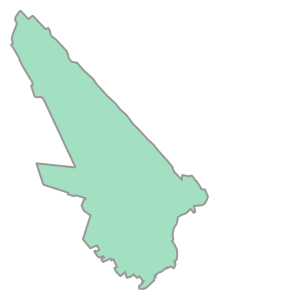

In [23]:
from traffic.data import airports
airports['LSZH']

In [ ]:
0.92 1.41

In [34]:
airports['LSZH'].taxiway.geoencode()

AttributeError: 'Overpass' object has no attribute 'geoencode'

In [29]:
datachart = airports['LSZH'].taxiway.data[['latitude', 'longitude', 'ref']]

for twy in ['J', 'B', 'K', 'A', 'E']:
    d = datachart.query(f'ref=="{twy}"')
    c = alt.Chart(d).mark_line().encode(latitude='latitude', longitude='longitude')
    display(airports['LSZH'].geoencode() + c)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)

alt.LayerChart(...)